# Cell 1 — Project setup & imports
## NaV state–state correlation explorer

This notebook lets you:

Discover and pick CSV to analyze.

Parse and filter by recycle number (from the filename, e.g., .r0.pdb, .r5.pdb).

Explore linear and non-linear correlations among the eight state coordinates: VSDI, VSDII, VSDIII, VSDIV, AG1, AG2, IFM, SF.

Produce high-quality scatter plots for every pair with fitted trends and annotated stats.

Notes

Point size encodes the recycle number.

We report Pearson’s r and R², Spearman’s ρ, and (optionally) Mutual Information (MI) for non-linear signal.

Plots use large fonts and outlined circles for presentation-ready figures.

If you’re missing packages, install (in your conda env):
pip install pandas numpy scipy scikit-learn matplotlib statsmodels


In [1]:
# Standard libs
from pathlib import Path
import re
import itertools
import textwrap
from typing import List, Tuple, Optional

# Data & stats
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.feature_selection import mutual_info_regression

# Plotting
import matplotlib as mpl
import matplotlib.pyplot as plt

# Optional LOWESS (robust non-linear smoother)
try:
    from statsmodels.nonparametric.smoothers_lowess import lowess
    HAS_LOWESS = True
except Exception:
    HAS_LOWESS = False

# --- Matplotlib style: big, readable, consistent ---
mpl.rcParams.update({
    "figure.dpi": 150,
    "savefig.dpi": 300,
    "axes.titlesize": 20,
    "axes.labelsize": 20,   # big axis labels
    "xtick.labelsize": 17,  # big tick labels
    "ytick.labelsize": 17,
    "legend.fontsize": 17,
    "font.size": 18,
    "axes.linewidth": 1.25,
    "xtick.major.width": 1.0,
    "ytick.major.width": 1.0,
})

DATA_DIR = Path("data")  # change if needed

# Helper: robust recycle parser from filename (handles ...r5.pdb or ...recycle5.pdb)
_RECYCLE_PATTS = [
    re.compile(r"[._-]r(\d+)\.pdb$", re.IGNORECASE),
    re.compile(r"recycle\s*(\d+)", re.IGNORECASE),
]

def parse_recycle_from_filename(fname: str) -> Optional[int]:
    for patt in _RECYCLE_PATTS:
        m = patt.search(fname)
        if m:
            try:
                return int(m.group(1))
            except Exception:
                return None
    return None

def list_csvs(root: Path) -> List[Path]:
    csvs = sorted(root.glob("*.csv"))
    return [p for p in csvs]

def ensure_numeric(df: pd.DataFrame, cols: List[str]) -> pd.DataFrame:
    out = df.copy()
    for c in cols:
        out[c] = pd.to_numeric(out[c], errors="coerce")
    return out

# Nice utility to print a framed message
def banner(msg: str) -> None:
    bar = "-" * 80
    print(bar)
    print(textwrap.fill(msg, width=80))
    print(bar)


 # Cell 2 — Pick a CSV to analyze
 ## 1) Choose which CSV to analyze

We scan ./data for CSV files, list them, and let you pick by index. You can change DATA_DIR above if your files are elsewhere.

Code:

In [2]:
csvs = list_csvs(DATA_DIR)
if not csvs:
    raise FileNotFoundError(f"No CSVs found under {DATA_DIR.resolve()}")

print("Discovered alphaOnly CSVs:")
for i, p in enumerate(csvs):
    print(f"{i:2d}: {p.name}")

# >>> EDIT THIS: choose the index you want <<<
SELECTED_INDEX = 0  # e.g., 0 for NaV1.1-alphaOnly.csv

if SELECTED_INDEX < 0 or SELECTED_INDEX >= len(csvs):
    raise IndexError(f"SELECTED_INDEX out of range (0..{len(csvs)-1})")

SELECTED_CSV = csvs[SELECTED_INDEX]
banner(f"Selected CSV: {SELECTED_CSV.name}")


Discovered alphaOnly CSVs:
 0: NaV1.2-CaM-full.csv
 1: NaV1.2-alphaOnly.csv
 2: NaV1.5-CaM-full.csv
 3: NaV1.5-alphaOnly.csv
--------------------------------------------------------------------------------
Selected CSV: NaV1.2-CaM-full.csv
--------------------------------------------------------------------------------


# Cell 3 — Load CSV, add recycle, and filter by allowed recycles
## 2) Load data, parse recycle from filename, and filter to chosen recycles

We parse the recycle number from the filename (e.g., .r0.pdb → recycle=0).

You can control which recycles to include by editing INCLUDE_RECYCLES.

By default we analyze R0 only (the most universally available pass).

In [3]:
# Which recycles to include? (edit as needed)
# Examples:
#   INCLUDE_RECYCLES = [0]            # only R0
#   INCLUDE_RECYCLES = [0,1,2,3,4,5]  # R0..R5
#   INCLUDE_RECYCLES = list(range(0,7))
INCLUDE_RECYCLES = [0,1,2,3,4,5,6]

raw = pd.read_csv(SELECTED_CSV)
if "filename" not in raw.columns:
    raise KeyError("Expected a 'filename' column in the CSV.")

# Parse recycle from filename
raw["recycle"] = raw["filename"].astype(str).apply(parse_recycle_from_filename)

# Report parsing rate
n_total = len(raw)
n_parsed = raw["recycle"].notna().sum()
banner(f"Parsed recycle for {n_parsed}/{n_total} rows (~{100*n_parsed/n_total:.1f}%).")

# Filter to desired recycles
df = raw[raw["recycle"].isin(INCLUDE_RECYCLES)].copy()
banner(f"After filtering to recycles {INCLUDE_RECYCLES}: {len(df)}/{len(raw)} rows remain.")

# Quick peek
df.head()


--------------------------------------------------------------------------------
Parsed recycle for 900/1000 rows (~90.0%).
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
After filtering to recycles [0, 1, 2, 3, 4, 5, 6]: 700/1000 rows remain.
--------------------------------------------------------------------------------


,filename,plddt full,plddt VSDI,plddt VSDII,plddt VSDIII,plddt VSDIV,plddt AG,plddt IFM,plddt SF,plddt partner,...,VSDIV,AG1,AG2,IFM,SF,iptm,plddt,ptm,CAM,recycle
0,hnaV1.2-CaM_unrelaxed_rank_072_alphafold2_mult...,79.933135,81.162000,84.232397,80.813435,82.06280,73.484167,65.230000,90.744545,52.310872,...,20.207635,11.682987,12.521538,9.467431,10.530637,0.515,63.8,0.655,7.102770,4.0
2,hnaV1.2-CaM_unrelaxed_rank_008_alphafold2_mult...,81.388549,81.753130,84.732893,83.021756,83.36528,76.692500,43.333333,89.982273,66.352550,...,21.035332,11.702217,12.555576,30.000622,10.373658,0.811,65.7,0.669,6.283792,5.0
3,hnaV1.2-CaM_unrelaxed_rank_075_alphafold2_mult...,81.572820,82.925478,84.798760,82.728702,82.67712,78.665833,47.596667,90.793182,58.892685,...,20.538656,12.886836,13.283458,27.836310,10.268781,0.666,65.6,0.675,5.978793,6.0
4,hnaV1.2-CaM_unrelaxed_rank_084_alphafold2_mult...,82.289767,83.855217,85.562231,83.398550,83.16816,81.005833,47.100000,90.930455,54.844497,...,20.321664,13.104377,13.173576,25.850266,10.173520,0.579,65.9,0.669,26.938403,6.0
5,hnaV1.2-CaM_unrelaxed_rank_039_alphafold2_mult...,79.380055,82.216783,84.207769,84.293206,78.81592,66.110833,52.726667,80.298636,56.065772,...,19.249545,12.120001,12.265094,12.516787,11.119417,0.558,63.5,0.622,26.112294,0.0


# Cell 4 — Define the state coordinate columns & sanity-check
## 3) Define the 8 state coordinates and verify they exist

We’ll analyze pairwise relationships among:

VSDI, VSDII, VSDIII, VSDIV, AG1, AG2, IFM, SF

We coerce these columns to numeric and drop rows with all‐NaN across the state set.

In [4]:
STATE_COLS = ["VSDI", "VSDII", "VSDIII", "VSDIV", "AG1", "AG2", "IFM", "SF"]

missing = [c for c in STATE_COLS if c not in df.columns]
if missing:
    raise KeyError(f"Missing expected state columns: {missing}")

df_states = ensure_numeric(df, STATE_COLS)

# Drop rows that are entirely NaN across the 8 states (keep partial NaN; we'll handle per-pair)
all_nan_mask = df_states[STATE_COLS].isna().all(axis=1)
dropped = int(all_nan_mask.sum())
df_states = df_states.loc[~all_nan_mask].copy()

banner(f"Dropped {dropped} rows with all-NaN across state columns. Remaining: {len(df_states)}")
df_states[STATE_COLS + ["recycle"]].head()


--------------------------------------------------------------------------------
Dropped 0 rows with all-NaN across state columns. Remaining: 700
--------------------------------------------------------------------------------


,VSDI,VSDII,VSDIII,VSDIV,AG1,AG2,IFM,SF,recycle
0,14.990753,14.878062,19.573368,20.207635,11.682987,12.521538,9.467431,10.530637,4.0
2,15.675875,15.298784,20.605618,21.035332,11.702217,12.555576,30.000622,10.373658,5.0
3,15.577974,15.224113,20.660042,20.538656,12.886836,13.283458,27.836310,10.268781,6.0
4,15.352106,15.103981,20.630568,20.321664,13.104377,13.173576,25.850266,10.173520,6.0
5,14.283660,15.285466,20.332407,19.249545,12.120001,12.265094,12.516787,11.119417,0.0


# Cell 5 — Correlation summary (Pearson, Spearman, optional MI)
## 4) Compute pairwise correlation metrics

For each pair among the 8 states (28 pairs total), we compute:

Pearson’s r and R² (linear association)

Spearman’s ρ (rank-based, robust to monotonic non-linearities)

Mutual Information (MI) (optional): captures any dependency (non-parametric).
MI here is the mean of MI(X→Y) and MI(Y→X) for symmetry.

We produce a sorted table so you can see which relationships stand out.

In [5]:
pairs = list(itertools.combinations(STATE_COLS, 2))

rows = []
for a, b in pairs:
    sub = df_states[[a, b]].dropna()
    if len(sub) < 3:
        rows.append((a, b, np.nan, np.nan, np.nan, np.nan))
        continue

    x = sub[a].values.astype(float)
    y = sub[b].values.astype(float)

    # Pearson
    r, p_lin = stats.pearsonr(x, y)
    r2 = r**2

    # Spearman
    rho, p_spear = stats.spearmanr(x, y)

    # Mutual information (symmetric)
    # Note: mutual_info_regression needs 2D X and 1D y; we do both directions
    try:
        mi_xy = mutual_info_regression(x.reshape(-1, 1), y, random_state=42)[0]
        mi_yx = mutual_info_regression(y.reshape(-1, 1), x, random_state=42)[0]
        mi = 0.5 * (mi_xy + mi_yx)
    except Exception:
        mi = np.nan

    rows.append((a, b, r, r2, rho, mi))

corr_table = pd.DataFrame(rows, columns=["A", "B", "pearson_r", "r2", "spearman_rho", "mutual_info"])

# Sort by strongest absolute Spearman (captures monotonic structure)
corr_table_sorted = corr_table.sort_values(by="spearman_rho", key=np.abs, ascending=False).reset_index(drop=True)

banner("Top pairs by |Spearman ρ| (monotonic signal):")
corr_table_sorted.head(20)


--------------------------------------------------------------------------------
Top pairs by |Spearman ρ| (monotonic signal):
--------------------------------------------------------------------------------


,A,B,pearson_r,r2,spearman_rho,mutual_info
0,VSDI,VSDIV,0.643826,0.414512,0.827305,0.859033
1,VSDI,VSDII,0.635819,0.404266,0.788876,0.819907
2,VSDII,VSDIII,0.787691,0.620457,0.776688,0.562455
3,VSDI,VSDIII,0.583156,0.340071,0.711461,0.693444
4,VSDII,VSDIV,0.461319,0.212815,0.707661,0.694279
5,VSDIII,VSDIV,0.321733,0.103512,0.570973,0.482646
6,AG1,IFM,-0.159883,0.025562,-0.435593,0.459543
7,AG1,AG2,0.201598,0.040642,0.345287,0.090479
8,VSDI,AG2,0.299116,0.089470,0.333146,0.155438
9,VSDIV,AG2,0.249671,0.062335,0.294392,0.142133


# Cell 6 — Heatmaps 
## 5) Heatmaps of Pearson’s r and Spearman’s ρ

A quick overview of linear vs. monotonic associations across all 8 states.


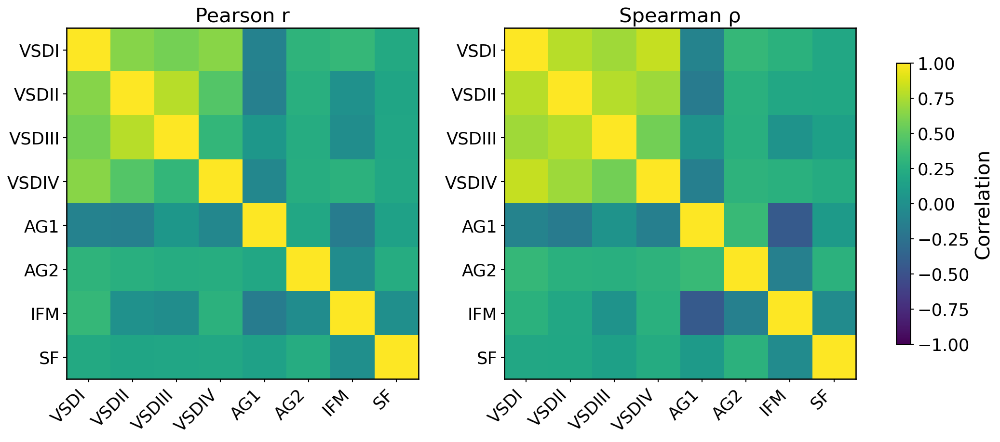

In [6]:
def corr_matrix(df: pd.DataFrame, cols: List[str], method: str = "pearson") -> pd.DataFrame:
    return df[cols].corr(method=method)

pearson_mat = corr_matrix(df_states, STATE_COLS, method="pearson")
spearman_mat = corr_matrix(df_states, STATE_COLS, method="spearman")

fig, axes = plt.subplots(1, 2, figsize=(14, 6), constrained_layout=True)

im0 = axes[0].imshow(pearson_mat.values, vmin=-1, vmax=1)
axes[0].set_title("Pearson r")
axes[1].imshow(spearman_mat.values, vmin=-1, vmax=1)
axes[1].set_title("Spearman ρ")

for ax in axes:
    ax.set_xticks(range(len(STATE_COLS)))
    ax.set_yticks(range(len(STATE_COLS)))
    ax.set_xticklabels(STATE_COLS, rotation=45, ha="right")
    ax.set_yticklabels(STATE_COLS)
    ax.grid(False)

cbar = fig.colorbar(im0, ax=axes.ravel().tolist(), shrink=0.8)
cbar.set_label("Correlation")

plt.show()


# Cell 7 — High-quality scatter + fitted trends for all pairs (saved)
## 6) Generate pairwise scatter plots with fits (saved to figs/)

For each of the 28 pairs:

Scatter with outlined circles; point size = f(recycle).

Linear fit (solid) with R² and Pearson r.

2nd-degree polynomial fit (dashed) to hint at simple non-linear structure.

LOWESS smooth (dotted) if statsmodels is available (robust non-parametric).

We also annotate Spearman ρ (monotonic structure) and MI (if available).

All figures are saved under figs/PAIR_A__B.png. We’ll also show the top 6 pairs inline by |Spearman ρ|.


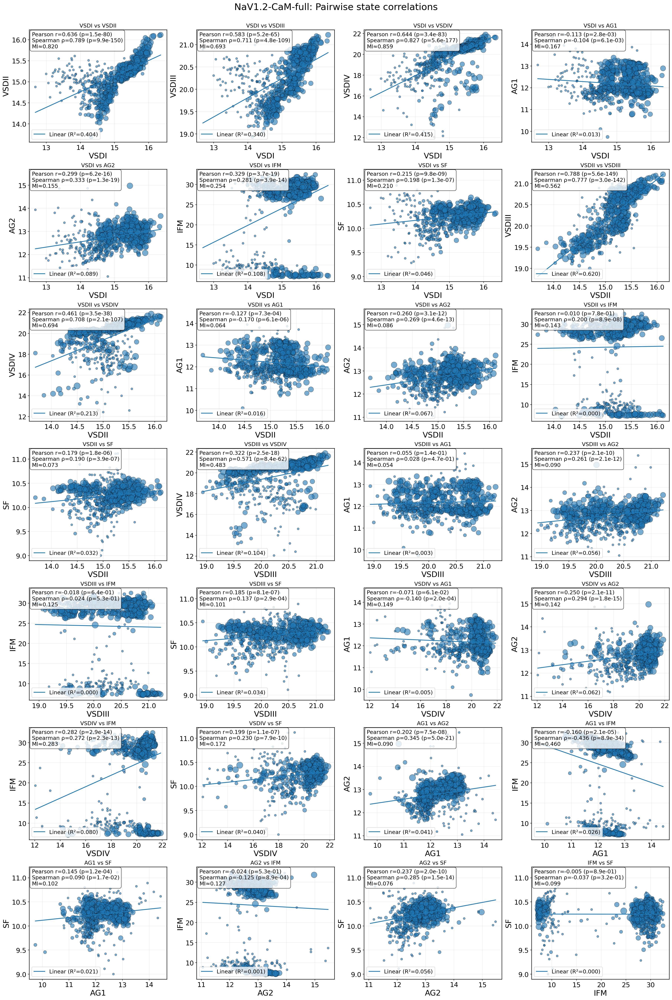

In [7]:
import math

def size_from_recycle(rec: np.ndarray, base: float = 30.0, step: float = 40.0) -> np.ndarray:
    rec = np.nan_to_num(rec, nan=0.0)
    return base + step * rec
FIG_GRID = (7, 4)  # rows, cols

def plot_pair_simple(ax, sub: pd.DataFrame, a: str, b: str):
    """Scatter with linear+quadratic fits and stat box."""
    x = sub[a].astype(float).values
    y = sub[b].astype(float).values

    # Stats
    r, p_lin = stats.pearsonr(x, y)
    rho, p_spear = stats.spearmanr(x, y)
    try:
        mi_xy = mutual_info_regression(x.reshape(-1,1), y, random_state=42)[0]
        mi_yx = mutual_info_regression(y.reshape(-1,1), x, random_state=42)[0]
        mi = 0.5*(mi_xy+mi_yx)
    except Exception:
        mi = np.nan

    # Scatter
    sizes = size_from_recycle(sub["recycle"].values)
    ax.scatter(x, y, s=sizes, alpha=0.6, edgecolor="black", linewidth=0.6)

    # Fits
    xgrid = np.linspace(np.nanmin(x), np.nanmax(x), 200)
    # Linear
    lin = LinearRegression().fit(x.reshape(-1,1), y)
    y_lin = lin.predict(xgrid.reshape(-1,1))
    r2 = lin.score(x.reshape(-1,1), y)
    ax.plot(xgrid, y_lin, '-', lw=2.0, color="tab:blue", label=f"Linear (R²={r2:.3f})")
    # Quadratic
    #quad_model = make_pipeline(PolynomialFeatures(2, include_bias=False), LinearRegression())
    #quad_model.fit(x.reshape(-1,1), y)
    #y_quad = quad_model.predict(xgrid.reshape(-1,1))
    #r2_quad = quad_model.score(x.reshape(-1,1), y)
    #ax.plot(xgrid, y_quad, '--', lw=2.0, color="tab:orange",
    #        label=f"Quadratic (R²={r2_quad:.3f})")


    # Labels
    ax.set_xlabel(a)
    ax.set_ylabel(b)
    ax.grid(True, alpha=0.25)

    # Stat box (top-left)
    txt = f"Pearson r={r:.3f} (p={p_lin:.1e})\nSpearman ρ={rho:.3f} (p={p_spear:.1e})"
    if not np.isnan(mi):
        txt += f"\nMI≈{mi:.3f}"
    ax.text(0.02, 0.98, txt, transform=ax.transAxes, va="top", ha="left",
            bbox=dict(boxstyle="round,pad=0.35", facecolor="white", alpha=0.8), fontsize=14)

    # Fit legend bottom-left
    ax.legend(loc="lower left", fontsize=14, frameon=True)

# ---- build the big grid ----
nrows, ncols = FIG_GRID
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*6, nrows*5), constrained_layout=True)
axes = axes.ravel()

for ax, (a,b) in zip(axes, pairs):
    sub = df_states[[a,b,"recycle"]].dropna()
    if len(sub) >= 3:
        plot_pair_simple(ax, sub, a, b)
        ax.set_title(f"{a} vs {b}", fontsize=14)
    else:
        ax.axis("off")
        ax.set_title(f"{a} vs {b}\n(no data)", fontsize=10)

# Hide any extra axes if pairs < grid slots
for ax in axes[len(pairs):]:
    ax.axis("off")

fig.suptitle(f"{SELECTED_CSV.stem}: Pairwise state correlations", fontsize=24, y=1.02)
plt.show()


## 7) Extra Legend for point sizes (recycle number)

We generate a small separate plot that just shows how marker size corresponds to recycle number.

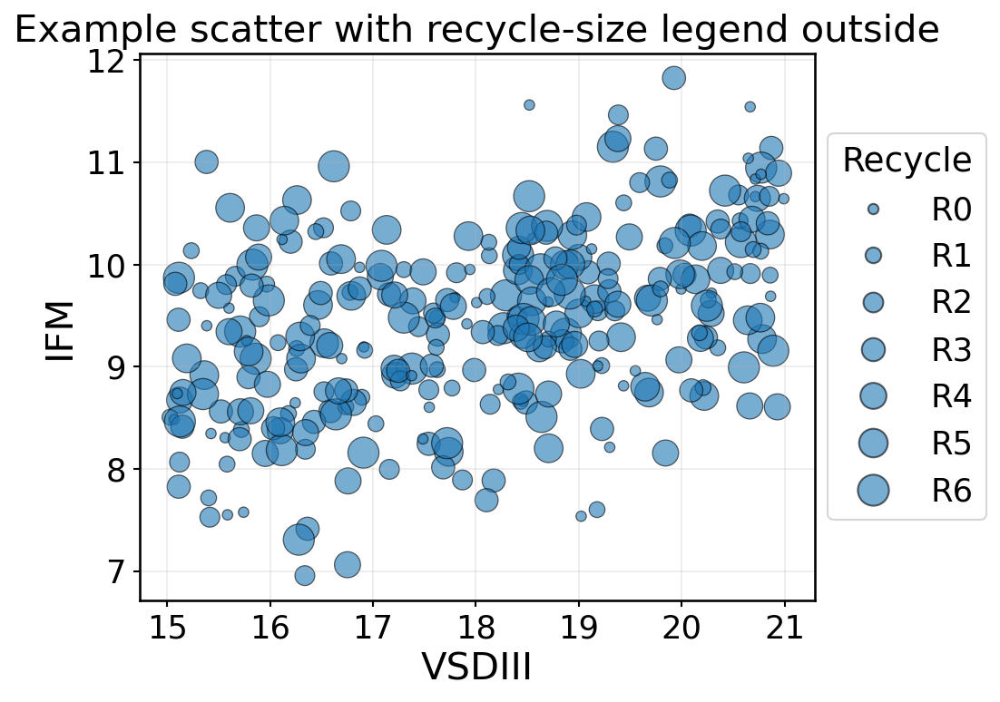

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# --- Example data (replace with your real columns) ---
np.random.seed(0)
x = np.random.uniform(15, 21, 300)
y = 5.0 + 0.25*x + np.random.normal(0, 0.8, 300)
recycles = np.random.randint(0, 7, 300)  # 0..6

# Your size function (same one you used in the notebook)
def size_from_recycle(rec: np.ndarray, base: float = 30.0, step: float = 40.0) -> np.ndarray:
    rec = np.nan_to_num(rec, nan=0.0)
    return base + step * rec

fig, ax = plt.subplots(figsize=(7.5, 5.5))

# --- Scatter ---
sc = ax.scatter(x, y,
                s=size_from_recycle(recycles),
                edgecolor="black", linewidth=0.6,
                facecolor="tab:blue", alpha=0.6)

ax.set_xlabel("VSDIII")
ax.set_ylabel("IFM")
ax.set_title("Example scatter with recycle-size legend outside")
ax.grid(True, alpha=0.25)

# --- Build circle legend OUTSIDE using Line2D handles ---
recycles_present = np.sort(np.unique(recycles[~np.isnan(recycles)]).astype(int))
sizes_pts2 = [size_from_recycle(np.array([r]))[0] for r in recycles_present]
handles = [
    Line2D([0], [0],
           marker='o', linestyle='None',
           markerfacecolor="tab:blue", markeredgecolor="black", alpha=0.6,
           markersize=np.sqrt(s),  # convert scatter's points^2 -> points
           label=f"R{r}")
    for r, s in zip(recycles_present, sizes_pts2)
]

# Place legend outside on the right
leg = ax.legend(handles=handles, title="Recycle",
                bbox_to_anchor=(1.02, 0.5), loc='center left',
                borderaxespad=0., frameon=True, fancybox=True)
plt.tight_layout()
plt.show()




# Cell 8 — Save a correlation summary CSV
## 8) Save correlation summary table
 We persist the per-pair correlation metrics so you can reference or share them. The file is named after the selected CSV.
 

In [9]:
summary_path = Path(f"correlations__{SELECTED_CSV.stem}.csv")
corr_table_sorted.to_csv(summary_path, index=False)
banner(f"Wrote correlation summary to: {summary_path.resolve()}")
corr_table_sorted.head(12)


--------------------------------------------------------------------------------
Wrote correlation summary to: /Users/dlopezmateos/Desktop/JGP-Nav-
paper/Revision/New-analysis/Analysis1/CaM/correlations__NaV1.2-CaM-full.csv
--------------------------------------------------------------------------------


,A,B,pearson_r,r2,spearman_rho,mutual_info
0,VSDI,VSDIV,0.643826,0.414512,0.827305,0.859033
1,VSDI,VSDII,0.635819,0.404266,0.788876,0.819907
2,VSDII,VSDIII,0.787691,0.620457,0.776688,0.562455
3,VSDI,VSDIII,0.583156,0.340071,0.711461,0.693444
4,VSDII,VSDIV,0.461319,0.212815,0.707661,0.694279
5,VSDIII,VSDIV,0.321733,0.103512,0.570973,0.482646
6,AG1,IFM,-0.159883,0.025562,-0.435593,0.459543
7,AG1,AG2,0.201598,0.040642,0.345287,0.090479
8,VSDI,AG2,0.299116,0.089470,0.333146,0.155438
9,VSDIV,AG2,0.249671,0.062335,0.294392,0.142133


# Cell 9
## 9) Run the full correlation & plotting analysis for all alphaOnly CSVs

This cell loops through every file that matches *alphaOnly*.csv in DATA_DIR,
runs the same pipeline we just used (parse recycle, filter, compute Pearson/Spearman/MI, make scatterplots with linear & quadratic fits),
and saves:

correlations__<file>.csv (summary table)

correlations__<file>.png (grid of scatterplots)

It uses exactly the same plotting style and stats as before.

In [16]:
# ---- CONFIG ----
INCLUDE_RECYCLES = list(range(0,7))   # adjust if you want to filter recycles differently
STATE_COLUMNS = ["VSDI","VSDII","VSDIII","VSDIV","AG1","AG2","IFM","SF"]

# Pretty axis labels (multi-line with units)
LABEL_MAP = {
    "VSDI":   "VSDI\n(GC1-S4 – HC-S2, Å)",
    "VSDII":  "VSDII\n(GC1-S4 – HC-S2, Å)",
    "VSDIII": "VSDIII\n(GC1-S4 – HC-S2, Å)",
    "VSDIV":  "VSDIV\n(GC1-S4 – HC-S2, Å)",
    "IFM":    "IFM\n(IFM – PD, Å)",
    "AG1":    "AG1\n(S6I – S6III, Å)",
    "AG2":    "AG2\n(S6II – S6IV, Å)",
    "SF":     "SF\n(SF-D – K, Å)",
}

csvs = list_csvs(DATA_DIR)
if not csvs:
    raise FileNotFoundError(f"No *alphaOnly* CSVs found in {DATA_DIR.resolve()}")

for csv_path in csvs:
    banner(f"Processing {csv_path.name}")

    # --- Load and clean ---
    df = pd.read_csv(csv_path)
    if "filename" not in df.columns:
        print(f"Skipping {csv_path.name}: no 'filename' column")
        continue

    df["recycle"] = df["filename"].astype(str).apply(parse_recycle_from_filename)
    df = df[df["recycle"].isin(INCLUDE_RECYCLES)].copy()

    # Drop rows missing all state columns
    df = df.dropna(how="all", subset=STATE_COLUMNS)
    if df.empty:
        print(f"  No rows after filtering recycles/state columns → skipped.")
        continue

    # --- Compute pairwise correlations ---
    from itertools import combinations
    from sklearn.feature_selection import mutual_info_regression
    import numpy as np
    from sklearn.linear_model import LinearRegression
    from scipy.stats import spearmanr, pearsonr

    records = []
    for a, b in combinations(STATE_COLUMNS, 2):
        x = pd.to_numeric(df[a], errors="coerce").values
        y = pd.to_numeric(df[b], errors="coerce").values

        # mask to drop NaNs for all stats consistently
        m = np.isfinite(x) & np.isfinite(y)
        if m.sum() < 3:
            continue
        x = x[m]; y = y[m]

        # Pearson (with p-value)
        r_pear, p_pear = pearsonr(x, y)

        # R2 from linear regression
        lin = LinearRegression().fit(x.reshape(-1,1), y)
        r2 = lin.score(x.reshape(-1,1), y)

        # Spearman (with p-value)
        rho, p_spear = spearmanr(x, y)

        # Mutual info (non-parametric, nats)
        mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))

        records.append({
            "A": a, "B": b,
            "pearson_r": r_pear, "pearson_p": p_pear,
            "r2": r2,
            "spearman_rho": rho, "spearman_p": p_spear,
            "mutual_info": mi
        })

    corr_table = pd.DataFrame(records)
    corr_table_sorted = corr_table.sort_values("spearman_rho", key=np.abs, ascending=False)

    # --- Save CSV ---
    csv_out = Path(f"correlations__{csv_path.stem}.csv")
    corr_table_sorted.to_csv(csv_out, index=False)
    print(f"  Saved table: {csv_out.name}")

    # --- Plot all pairs (28 combos) ---
    import matplotlib.pyplot as plt
    import seaborn as sns

    n_pairs = len(records)
    ncols = 4
    nrows = int(np.ceil(n_pairs / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(8*ncols, 5*nrows))
    axes = axes.flatten()

    # Quick lookup for stats by pair (A,B) or (B,A)
    stats_lookup = {(r["A"], r["B"]): r for r in records}
    stats_lookup.update({(r["B"], r["A"]): r for r in records})

    for ax, (a,b) in zip(axes, combinations(STATE_COLUMNS, 2)):
        if (a, b) not in stats_lookup:
            ax.axis("off"); continue

        # Data
        x = pd.to_numeric(df[a], errors="coerce").values
        y = pd.to_numeric(df[b], errors="coerce").values
        m = np.isfinite(x) & np.isfinite(y)
        if m.sum() < 3:
            ax.axis("off"); continue
        x = x[m]; y = y[m]

        ax.scatter(x, y, s=40+df.loc[m, "recycle"]*40, edgecolor="black",
                   facecolor="tab:blue", alpha=0.6)

        # Linear fit
        #lin = LinearRegression().fit(x.reshape(-1,1), y)
        #xs = np.linspace(np.nanmin(x), np.nanmax(x), 200)
        #ax.plot(xs, lin.predict(xs.reshape(-1,1)), color="C1",
        #        lw=2, label=f"Linear (R²={lin.score(x.reshape(-1,1), y):.2f})")

        # Stats box with p-values
        row = stats_lookup[(a,b)]
        ax.text(
            0.05, 0.95,
            f"Spearman ρ={row['spearman_rho']:.3f} (p={row['spearman_p']:.1e})\n"
            f"MI≈{row['mutual_info']:.3f}",
            transform=ax.transAxes, ha="left", va="top",
            fontsize=16, bbox=dict(boxstyle="round", fc="w", alpha=0.7)
        )

        # Expanded axis labels
        ax.set_xlabel(LABEL_MAP.get(a, a), fontsize=24)
        ax.set_ylabel(LABEL_MAP.get(b, b), fontsize=24)

        ax.tick_params(labelsize=22)
        ax.legend(loc="lower left", fontsize=16)

    # Turn off empty axes
    for j in range(len(records), len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    png_out = Path(f"correlations__{csv_path.stem}.png")
    plt.savefig(png_out, dpi=300, bbox_inches="tight")
    plt.close(fig)
    print(f"  Saved plots: {png_out.name}")

banner("Batch correlation analysis complete.")



----------------------------------------------------------------------------------------------------
Processing NaV1.2-CaM-full.csv
----------------------------------------------------------------------------------------------------
  Saved table: correlations__NaV1.2-CaM-full.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/4279219278.py:68: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/4279219278.py:68: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/4279219278.py:68: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  Saved plots: correlations__NaV1.2-CaM-full.png

----------------------------------------------------------------------------------------------------
Processing NaV1.2-alphaOnly.csv
----------------------------------------------------------------------------------------------------
  Saved table: correlations__NaV1.2-alphaOnly.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/4279219278.py:68: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/4279219278.py:68: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/4279219278.py:68: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  Saved plots: correlations__NaV1.2-alphaOnly.png

----------------------------------------------------------------------------------------------------
Processing NaV1.5-CaM-full.csv
----------------------------------------------------------------------------------------------------
  Saved table: correlations__NaV1.5-CaM-full.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/4279219278.py:68: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/4279219278.py:68: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/4279219278.py:68: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  Saved plots: correlations__NaV1.5-CaM-full.png

----------------------------------------------------------------------------------------------------
Processing NaV1.5-alphaOnly.csv
----------------------------------------------------------------------------------------------------
  Saved table: correlations__NaV1.5-alphaOnly.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/4279219278.py:68: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/4279219278.py:68: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/4279219278.py:68: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  Saved plots: correlations__NaV1.5-alphaOnly.png

----------------------------------------------------------------------------------------------------
Batch correlation analysis complete.
----------------------------------------------------------------------------------------------------


In [11]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


## 9.2) Batch: per-channel and per-recycle correlation panels (7 images per CSV)
This cell expands the batch routine so that for each α-only CSV it also splits the data by recycle R0–R6 and saves a correlation CSV and a full 28-pair panel PNG per recycle. Filenames are suffixed with __R{r} to avoid overwriting.

In [17]:
# 9) Batch correlations per channel and per recycle (R0..R6) — saves 7 images per CSV
#    Reuses your same plotting style; only adds an inner loop over recycle.

INCLUDE_RECYCLES = list(range(0,7))
STATE_COLUMNS = ["VSDI","VSDII","VSDIII","VSDIV","AG1","AG2","IFM","SF"]

csvs = list_csvs(DATA_DIR)
if not csvs:
    raise FileNotFoundError(f"No CSVs found in {DATA_DIR.resolve()}")

from itertools import combinations
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import mutual_info_regression
from scipy.stats import spearmanr

for csv_path in csvs:
    banner(f"[Per-recycle] Processing {csv_path.name}")
    raw = pd.read_csv(csv_path)
    if "filename" not in raw.columns:
        print(f"  Skipping {csv_path.name}: no 'filename' column")
        continue

    raw["recycle"] = raw["filename"].astype(str).apply(parse_recycle_from_filename)
    raw = raw[raw["recycle"].isin(INCLUDE_RECYCLES)].copy()
    raw = raw.dropna(how="all", subset=STATE_COLUMNS)
    if raw.empty:
        print("  No rows after filtering recycles/state columns → skipped.")
        continue

    # Iterate each recycle separately
    for r in sorted(raw["recycle"].dropna().unique().astype(int)):
        df = raw[raw["recycle"] == r].copy()
        if df.empty:
            continue

        # ---- Compute correlations for this recycle ----
        recs = []
        for a, b in combinations(STATE_COLUMNS, 2):
            x = pd.to_numeric(df[a], errors="coerce").values
            y = pd.to_numeric(df[b], errors="coerce").values
            mask = np.isfinite(x) & np.isfinite(y)
            if mask.sum() < 3:
                continue
            x = x[mask]; y = y[mask]

            pearson_r = np.corrcoef(x, y)[0, 1]
            lin = LinearRegression().fit(x.reshape(-1,1), y)
            r2 = lin.score(x.reshape(-1,1), y)
            sp_rho, _ = spearmanr(x, y)
            mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
            recs.append({"A":a, "B":b,
                         "pearson_r":pearson_r, "r2":r2,
                         "spearman_rho":sp_rho, "mutual_info":mi})

        corr_table = pd.DataFrame(recs)
        if corr_table.empty:
            print(f"  R{r}: no valid pairs")
            continue

        corr_table_sorted = corr_table.sort_values("spearman_rho", key=np.abs, ascending=False)

        # ---- Save CSV for this recycle ----
        csv_out = Path(f"correlations__{csv_path.stem}__R{r}.csv")
        corr_table_sorted.to_csv(csv_out, index=False)
        print(f"  R{r}: saved table → {csv_out.name}")

        # ---- Plot all pairs (28 combos) for this recycle ----
        n_pairs = len(list(combinations(STATE_COLUMNS, 2)))
        ncols = 4
        nrows = int(np.ceil(n_pairs / ncols))
        fig, axes = plt.subplots(nrows, ncols, figsize=(8*ncols, 5*nrows))
        axes = axes.flatten()

        pair_iter = list(combinations(STATE_COLUMNS, 2))
        # build a quick lookup for stats text
        stats_lookup = {(row["A"], row["B"]): row for _, row in corr_table.iterrows()}
        stats_lookup.update({(row["B"], row["A"]): row for _, row in corr_table.iterrows()})

        for ax, (a,b) in zip(axes, pair_iter):
            x = pd.to_numeric(df[a], errors="coerce").values
            y = pd.to_numeric(df[b], errors="coerce").values
            m = np.isfinite(x) & np.isfinite(y)
            if m.sum() < 3:
                ax.axis("off")
                continue
            x = x[m]; y = y[m]

            ax.scatter(x, y, s=80, edgecolor="black", facecolor="tab:blue", alpha=0.6)
            #lin = LinearRegression().fit(x.reshape(-1,1), y)
            #xs = np.linspace(np.nanmin(x), np.nanmax(x), 200)
            #ax.plot(xs, lin.predict(xs.reshape(-1,1)), color="C1", lw=2,
            #        label=f"Linear (R²={lin.score(x.reshape(-1,1), y):.2f})")

            row = stats_lookup.get((a,b))
            if row is not None:
                ax.text(0.03, 0.97,
                        f"Spearman ρ={row['spearman_rho']:.3f}\n"
                        f"MI≈{row['mutual_info']:.3f}",
                        transform=ax.transAxes, ha="left", va="top",
                        fontsize=17, bbox=dict(boxstyle="round", fc="w", alpha=0.75))

            ax.set_xlabel(f"{a} State", fontsize=18)
            ax.set_ylabel(f"{b} State", fontsize=18)
            ax.tick_params(labelsize=16)
            ax.legend(loc="lower left", fontsize=14)

        for j in range(len(pair_iter), len(axes)):
            axes[j].axis("off")

        fig.suptitle(f"{csv_path.stem} — Recycle R{r}", fontsize=22, y=0.995)
        plt.tight_layout()
        png_out = Path(f"correlations__{csv_path.stem}__R{r}.png")
        plt.savefig(png_out, dpi=300, bbox_inches="tight")
        plt.close(fig)
        print(f"  R{r}: saved panel → {png_out.name}")

banner("Per-recycle correlation analysis complete.")



----------------------------------------------------------------------------------------------------
[Per-recycle] Processing NaV1.2-CaM-full.csv
----------------------------------------------------------------------------------------------------
  R0: saved table → correlations__NaV1.2-CaM-full__R0.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R0: saved panel → correlations__NaV1.2-CaM-full__R0.png
  R1: saved table → correlations__NaV1.2-CaM-full__R1.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R1: saved panel → correlations__NaV1.2-CaM-full__R1.png
  R2: saved table → correlations__NaV1.2-CaM-full__R2.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R2: saved panel → correlations__NaV1.2-CaM-full__R2.png
  R3: saved table → correlations__NaV1.2-CaM-full__R3.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R3: saved panel → correlations__NaV1.2-CaM-full__R3.png
  R4: saved table → correlations__NaV1.2-CaM-full__R4.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R4: saved panel → correlations__NaV1.2-CaM-full__R4.png
  R5: saved table → correlations__NaV1.2-CaM-full__R5.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R5: saved panel → correlations__NaV1.2-CaM-full__R5.png
  R6: saved table → correlations__NaV1.2-CaM-full__R6.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R6: saved panel → correlations__NaV1.2-CaM-full__R6.png

----------------------------------------------------------------------------------------------------
[Per-recycle] Processing NaV1.2-alphaOnly.csv
----------------------------------------------------------------------------------------------------
  R0: saved table → correlations__NaV1.2-alphaOnly__R0.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R0: saved panel → correlations__NaV1.2-alphaOnly__R0.png
  R1: saved table → correlations__NaV1.2-alphaOnly__R1.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R1: saved panel → correlations__NaV1.2-alphaOnly__R1.png
  R2: saved table → correlations__NaV1.2-alphaOnly__R2.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R2: saved panel → correlations__NaV1.2-alphaOnly__R2.png
  R3: saved table → correlations__NaV1.2-alphaOnly__R3.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R3: saved panel → correlations__NaV1.2-alphaOnly__R3.png
  R4: saved table → correlations__NaV1.2-alphaOnly__R4.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R4: saved panel → correlations__NaV1.2-alphaOnly__R4.png
  R5: saved table → correlations__NaV1.2-alphaOnly__R5.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R5: saved panel → correlations__NaV1.2-alphaOnly__R5.png
  R6: saved table → correlations__NaV1.2-alphaOnly__R6.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R6: saved panel → correlations__NaV1.2-alphaOnly__R6.png

----------------------------------------------------------------------------------------------------
[Per-recycle] Processing NaV1.5-CaM-full.csv
----------------------------------------------------------------------------------------------------
  R0: saved table → correlations__NaV1.5-CaM-full__R0.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R0: saved panel → correlations__NaV1.5-CaM-full__R0.png
  R1: saved table → correlations__NaV1.5-CaM-full__R1.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R1: saved panel → correlations__NaV1.5-CaM-full__R1.png
  R2: saved table → correlations__NaV1.5-CaM-full__R2.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R2: saved panel → correlations__NaV1.5-CaM-full__R2.png
  R3: saved table → correlations__NaV1.5-CaM-full__R3.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R3: saved panel → correlations__NaV1.5-CaM-full__R3.png
  R4: saved table → correlations__NaV1.5-CaM-full__R4.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R4: saved panel → correlations__NaV1.5-CaM-full__R4.png
  R5: saved table → correlations__NaV1.5-CaM-full__R5.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R5: saved panel → correlations__NaV1.5-CaM-full__R5.png
  R6: saved table → correlations__NaV1.5-CaM-full__R6.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R6: saved panel → correlations__NaV1.5-CaM-full__R6.png

----------------------------------------------------------------------------------------------------
[Per-recycle] Processing NaV1.5-alphaOnly.csv
----------------------------------------------------------------------------------------------------
  R0: saved table → correlations__NaV1.5-alphaOnly__R0.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R0: saved panel → correlations__NaV1.5-alphaOnly__R0.png
  R1: saved table → correlations__NaV1.5-alphaOnly__R1.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R1: saved panel → correlations__NaV1.5-alphaOnly__R1.png
  R2: saved table → correlations__NaV1.5-alphaOnly__R2.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R2: saved panel → correlations__NaV1.5-alphaOnly__R2.png
  R3: saved table → correlations__NaV1.5-alphaOnly__R3.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R3: saved panel → correlations__NaV1.5-alphaOnly__R3.png
  R4: saved table → correlations__NaV1.5-alphaOnly__R4.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R4: saved panel → correlations__NaV1.5-alphaOnly__R4.png
  R5: saved table → correlations__NaV1.5-alphaOnly__R5.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R5: saved panel → correlations__NaV1.5-alphaOnly__R5.png
  R6: saved table → correlations__NaV1.5-alphaOnly__R6.csv


/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mi = float(mutual_info_regression(x.reshape(-1,1), y, discrete_features=False))
/var/folders/yg/k6t1j6jx32x4dnx7sz20k7b40000gr/T/ipykernel_47500/1188407436.py:55: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element

  R6: saved panel → correlations__NaV1.5-alphaOnly__R6.png

----------------------------------------------------------------------------------------------------
Per-recycle correlation analysis complete.
----------------------------------------------------------------------------------------------------


## 9.3) “Barcode” overview: per-pair, per-recycle maps for Pearson, Spearman, and MI
This cell reads the per-recycle CSVs you just wrote for one chosen channel (or for all and stacks them), builds a tidy table of metrics for every pair × recycle, and draws three compact “barcode” heatmaps—one for each statistic. Rows are state pairs, columns are recycles R0–R6. Values are centered color scales; Spearman shows magnitude with sign, MI is non-negative.

In [13]:
# Reads the per-recycle correlation CSVs produced by cell 9:
#   correlations__<STEM>__R<r>.csv  for r in 0..6

from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def banner(msg): print("\n" + "-"*100 + f"\n{msg}\n" + "-"*100)

# --- Discover all per-recycle correlation files ---
corr_files = sorted(Path(".").glob("correlations__*__R*.csv"))
if not corr_files:
    raise FileNotFoundError("No per-recycle correlation CSVs found. Run cell 9 first.")

# --- Assemble a tidy table across all channels/recycles ---
records = []
for path in corr_files:
    # Expect: correlations__<stem>__R<r>.csv
    after = path.name.split("correlations__", 1)[1]
    stem, r_part = after.rsplit("__R", 1)
    r_val = int(Path(r_part).stem)  # handles .csv
    dfc = pd.read_csv(path)
    for _, row in dfc.iterrows():
        records.append({
            "channel_stem": stem,
            "recycle": r_val,
            "pair": f"{row['A']}–{row['B']}",
            "pearson_r": float(row["pearson_r"]),
            "spearman_rho": float(row["spearman_rho"]),
            "mutual_info": float(row["mutual_info"]),
        })

long = pd.DataFrame(records)
if long.empty:
    raise RuntimeError("Assembled table is empty.")

# --- Helper to plot one channel’s barcode figure ---
def plot_channel_barcodes(df_chan: pd.DataFrame, stem: str) -> Path:
    # Order rows (pairs) by |Spearman| at R0 (or first available recycle)
    available_r = sorted(df_chan["recycle"].unique())
    ref_r = 0 if 0 in available_r else available_r[0]
    pair_order = (
        df_chan[df_chan["recycle"] == ref_r]
        .assign(_abs_rho=lambda d: d["spearman_rho"].abs())
        .sort_values("_abs_rho", ascending=False)["pair"]
        .tolist()
    )
    if not pair_order:
        pair_order = sorted(df_chan["pair"].unique())

    # Consistent recycle columns
    recycles_sorted = sorted(df_chan["recycle"].unique())

    def pivot_metric(metric):
        mat = df_chan.pivot_table(index="pair", columns="recycle", values=metric, aggfunc="mean")
        mat = mat.reindex(index=pair_order, columns=recycles_sorted)
        return mat

    M_pear = pivot_metric("pearson_r")
    M_spea = pivot_metric("spearman_rho")
    M_mi   = pivot_metric("mutual_info")

    # Figure size scales with #pairs for readability
    fig_h = max(6, 0.35 * len(pair_order))
    fig, axes = plt.subplots(
        1, 3, figsize=(24, fig_h), constrained_layout=True
    )

    # Pearson & Spearman: diverging cmap centered at 0
    sns.heatmap(M_pear, ax=axes[0], cmap="vlag", center=0,
                cbar_kws={"label": "Pearson r"})
    axes[0].set_title(f"{stem}\nPearson by recycle", fontsize=16)
    axes[0].set_xlabel("Recycle"); axes[0].set_ylabel("Pair (state A–B)")

    sns.heatmap(M_spea, ax=axes[1], cmap="vlag", center=0,
                cbar_kws={"label": "Spearman ρ"})
    axes[1].set_title(f"{stem}\nSpearman by recycle", fontsize=16)
    axes[1].set_xlabel("Recycle"); axes[1].set_ylabel("")

    # MI ≥ 0 → sequential cmap
    sns.heatmap(M_mi, ax=axes[2], cmap="magma",
                cbar_kws={"label": "Mutual information"})
    axes[2].set_title(f"{stem}\nMutual information by recycle", fontsize=16)
    axes[2].set_xlabel("Recycle"); axes[2].set_ylabel("")

    for ax in axes:
        ax.tick_params(labelsize=14)

    out_path = Path(f"barcode_metrics__{stem}.png")
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)
    return out_path

# --- Generate one PNG per channel stem ---
outputs = []
for stem, df_chan in long.groupby("channel_stem", sort=True):
    banner(f"Rendering barcode heatmaps for: {stem}")
    out = plot_channel_barcodes(df_chan.copy(), stem)
    print(f"  Saved → {out.resolve()}")
    outputs.append(out)

banner(f"Done. Wrote {len(outputs)} barcode figures.")



----------------------------------------------------------------------------------------------------
Rendering barcode heatmaps for: NaV1.2-CaM-full
----------------------------------------------------------------------------------------------------
  Saved → /Users/dlopezmateos/Desktop/JGP-Nav-paper/Revision/New-analysis/Analysis1/CaM/barcode_metrics__NaV1.2-CaM-full.png

----------------------------------------------------------------------------------------------------
Rendering barcode heatmaps for: NaV1.2-alphaOnly
----------------------------------------------------------------------------------------------------
  Saved → /Users/dlopezmateos/Desktop/JGP-Nav-paper/Revision/New-analysis/Analysis1/CaM/barcode_metrics__NaV1.2-alphaOnly.png

----------------------------------------------------------------------------------------------------
Rendering barcode heatmaps for: NaV1.5-CaM-full
------------------------------------------------------------------------------------------------

# Cell 10
## Barcode-style heatmaps by NaV channel (columns) using the aggregated correlation CSVs

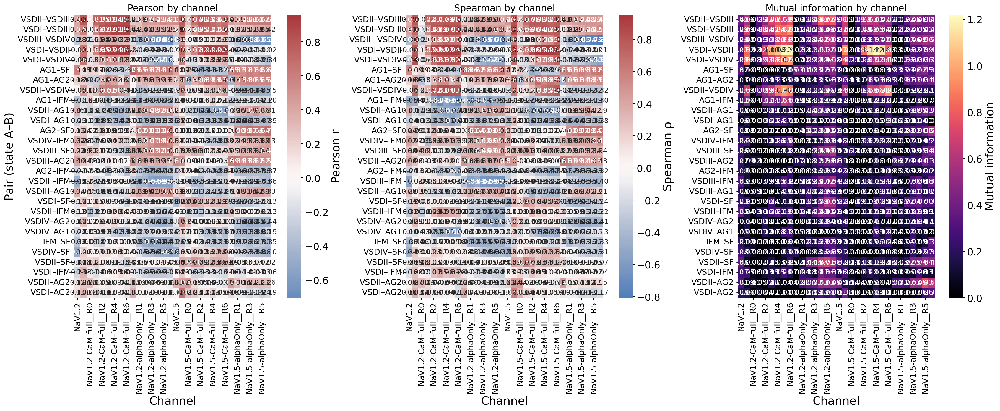


----------------------------------------------------------------------------------------------------
Saved by-channel barcode heatmaps (aggregated) → /Users/dlopezmateos/Desktop/JGP-Nav-paper/Revision/New-analysis/Analysis1/CaM/barcode_metrics__by_channel__AGGREGATED.png
----------------------------------------------------------------------------------------------------


In [14]:
from pathlib import Path
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ---------- CONFIG ----------
ANNOTATE = True           # overlay the numeric values on each heatmap cell
ANNO_FMT = ".2f"          # format for annotations
ANNO_ABS = False          # annotate absolute values if True
# Optional custom ordering of channels (fallback to alphanumeric if None)
CHANNELS_ORDER = ["NaV1.2-alphaOnly","NaV1.2-CaM-full",
                  "NaV1.5-alphaOnly","NaV1.5-CaM-full"]
# ----------------------------

# Dictionary to map CSV stems to clean channel labels
CHANNEL_LABELS = {
    "NaV1.2-alphaOnly": "NaV1.2",
    "NaV1.5-alphaOnly": "NaV1.5",
    "NaV1.2-CaM-full": "NaV1.2+CaM",
    "NaV1.5-CaM-full": "NaV1.5+CaM"
}

def banner(msg):
    print("\n" + "-"*100 + f"\n{msg}\n" + "-"*100)

# Robustly find aggregated correlation CSVs (both single and double underscore variants)
files = sorted(list(Path(".").glob("correlations__*.csv")) + list(Path(".").glob("correlations_*.csv")))
if not files:
    raise FileNotFoundError("No aggregated correlation CSVs matching 'correlations__*.csv' or 'correlations_*.csv' found.")

# Extract a channel stem from filename:
# expect names like 'correlations__NaV1.7-alphaOnly.csv' or 'correlations_NaV1.7-alphaOnly.csv'
def stem_from_filename(p: Path) -> str:
    name = p.name
    name = re.sub(r"^correlations_+", "", name)  # drop leading 'correlations_' or 'correlations__'
    name = re.sub(r"\.csv$", "", name)
    return name

records = []
for p in files:
    raw_name = stem_from_filename(p)
    stem = CHANNEL_LABELS.get(raw_name, raw_name)
    dfc = pd.read_csv(p)
    # Required columns (some older CSVs may lack p-values; that's fine)
    needed = {"A","B","pearson_r","spearman_rho","mutual_info"}
    if not needed.issubset(set(dfc.columns)):
        print(f"[WARN] Skipping {p.name}: missing columns {needed - set(dfc.columns)}")
        continue
    for _, r in dfc.iterrows():
        pair = f"{r['A']}–{r['B']}"
        records.append({
            "channel": stem,
            "pair": pair,
            "pearson_r": float(r["pearson_r"]),
            "spearman_rho": float(r["spearman_rho"]),
            "mutual_info": float(r["mutual_info"])
        })

long = pd.DataFrame(records)
if long.empty:
    raise RuntimeError("No data assembled from aggregated CSVs.")

# Column order (channels)
channels_seen = sorted(long["channel"].unique())

def natural_key(s: str):
    # natural sort for NaV1.1 ... NaV1.9, NaX; splits numbers for intuitive ordering
    return [int(t) if t.isdigit() else t for t in re.split(r"(\d+)", s)]

if CHANNELS_ORDER is None:
    channels = sorted(channels_seen, key=natural_key)
else:
    channels = [c for c in CHANNELS_ORDER if c in channels_seen] + [c for c in channels_seen if c not in CHANNELS_ORDER]

# Row order (pairs): by |mean Spearman| across channels
pair_rank = (
    long.groupby("pair", as_index=False)["spearman_rho"]
        .apply(lambda s: s.abs().mean())
        .rename(columns={"spearman_rho":"abs_rho_mean"})
        .sort_values("abs_rho_mean", ascending=False)
)
pairs_ordered = pair_rank["pair"].tolist()

def pivot_metric(metric: str) -> pd.DataFrame:
    mat = long.pivot_table(index="pair", columns="channel", values=metric, aggfunc="mean")
    mat = mat.reindex(index=pairs_ordered, columns=channels)
    return mat

M_pear = pivot_metric("pearson_r")
M_spea = pivot_metric("spearman_rho")
M_mi   = pivot_metric("mutual_info")
#force identical row/column order across metrics ---
M_spea = M_spea.reindex_like(M_pear)
M_mi   = M_mi.reindex_like(M_pear)

# Figure size scales with number of pairs
fig_h = max(6, 0.35 * len(pairs_ordered))
fig, axes = plt.subplots(1, 3, figsize=(24, fig_h), constrained_layout=True)

def annot_matrix(df):
    if not ANNOTATE:
        return None
    vals = df.values
    return np.abs(vals) if ANNO_ABS else vals

# Pearson: diverging, centered at 0
sns.heatmap(
    M_pear, ax=axes[0], cmap="vlag", center=0,
    annot=annot_matrix(M_pear), fmt=ANNO_FMT, annot_kws={"fontsize":12},
    cbar_kws={"label": "Pearson r"}
)
axes[0].set_title("Pearson by channel", fontsize=16)
axes[0].set_xlabel("Channel"); axes[0].set_ylabel("Pair (state A–B)")

# Spearman: diverging, centered at 0
sns.heatmap(
    M_spea, ax=axes[1], cmap="vlag", center=0,
    annot=annot_matrix(M_spea), fmt=ANNO_FMT, annot_kws={"fontsize":12},
    cbar_kws={"label": "Spearman ρ"}
)
axes[1].set_title("Spearman by channel", fontsize=16)
axes[1].set_xlabel("Channel"); axes[1].set_ylabel("")

# MI: sequential (nonnegative)
sns.heatmap(
    M_mi, ax=axes[2], cmap="magma",
    annot=annot_matrix(M_mi), fmt=ANNO_FMT, annot_kws={"fontsize":12},
    cbar_kws={"label": "Mutual information"}
)
axes[2].set_title("Mutual information by channel", fontsize=16)
axes[2].set_xlabel("Channel"); axes[2].set_ylabel("")
axes[2].set_yticks(axes[0].get_yticks())
axes[2].set_yticklabels([t.get_text() for t in axes[0].get_yticklabels()])
for ax in axes:
    ax.tick_params(labelsize=14)

out_png = Path("barcode_metrics__by_channel__AGGREGATED.png")
plt.savefig(out_png, dpi=300, bbox_inches="tight")
plt.show()

banner(f"Saved by-channel barcode heatmaps (aggregated) → {out_png.resolve()}")
